### convert the json file from https://lila.science/datasets/wcscameratraps to the gcloud csv format 

### main solution starts [here](#1)

### final functions can be found [here](#2)

In [2]:
import json
import pandas as pd
from PIL import Image
import requests
from io import BytesIO
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [54]:
with open('wcs_20220205_bboxes_with_classes/wcs_20220205_bboxes_with_classes.json', 'r') as f:
    data = json.load(f)

In [55]:
data.keys()

dict_keys(['images', 'annotations', 'categories', 'info'])

In [56]:
i = 100000

In [57]:
data['images'][i]

{'id': 'e90ebd57-92d4-11e9-a3b4-000d3a74c7de',
 'wcs_id': 'bol-019-d0037-i038728',
 'file_name': 'animals/0093/0998.jpg',
 'frame_num': 10,
 'seq_id': 'bol-019-d0037-64',
 'country_code': 'bol',
 'match_level': 0,
 'datetime': '2012-10-23 07:31:52.000',
 'location': '752',
 'width': 2048,
 'height': 1536,
 'corrupt': False,
 'seq_num_frames': 10,
 'status': ''}

In [26]:
data['annotations'][i]

{'id': '7ba1cc79-86d4-11ec-8c0f-5cf3706028c2',
 'image_id': '349108f6-92d5-11e9-9668-000d3a74c7de',
 'sequence_level_annotation': False,
 'category_id': 71,
 'bbox': [1114.434, 664.7164, 105.38946, 73.52036]}

#### some annotations dont have a bbox 

In [25]:
data['annotations'][10000]

{'id': '7a9be1c4-86d4-11ec-bc19-5cf3706028c2',
 'image_id': '35815c41-92d5-11e9-9636-000d3a74c7de',
 'sequence_level_annotation': False,
 'category_id': 0}

In [22]:
data['annotations'][i].keys()

dict_keys(['id', 'image_id', 'sequence_level_annotation', 'category_id', 'bbox'])

the image_id in annotations connects to the id in images

In [26]:
catid = data['annotations'][i]['category_id']
data['categories'][catid]

{'id': 2, 'name': 'tayassu pecari', 'count': 95788}

In [27]:
print(catid)

2


In [8]:
data['info']

{'version': 'bboxes-2.0',
 'description': 'Camera trap data from the Wildlife Conservation Society (bounding boxes)',
 'date_created': '2019',
 'contributor': 'WCS'}

In [9]:
len(data['images'])

298725

In [10]:
len(data['annotations'])

429482

In [11]:
len(data['categories'])

678

In [12]:
data['categories']

[{'id': 0, 'name': 'empty', 'count': 591874},
 {'id': 1, 'name': 'psophia leucoptera', 'count': 8214},
 {'id': 2, 'name': 'tayassu pecari', 'count': 95788},
 {'id': 3, 'name': 'dasyprocta punctata', 'count': 15860},
 {'id': 4, 'name': 'cuniculus paca', 'count': 6659},
 {'id': 5, 'name': 'sciurus spadiceus', 'count': 1681},
 {'id': 6, 'name': 'puma concolor', 'count': 6823},
 {'id': 7, 'name': 'tapirus terrestris', 'count': 8199},
 {'id': 8, 'name': 'pecari tajacu', 'count': 10397},
 {'id': 9, 'name': 'mazama americana', 'count': 6858},
 {'id': 10, 'name': 'leopardus pardalis', 'count': 14948},
 {'id': 11, 'name': 'mitu tuberosum', 'count': 12367},
 {'id': 12, 'name': 'geotrygon montana', 'count': 649},
 {'id': 13, 'name': 'nasua nasua', 'count': 1453},
 {'id': 14, 'name': 'dasypus novemcinctus', 'count': 2424},
 {'id': 15, 'name': 'eira barbara', 'count': 2464},
 {'id': 16, 'name': 'didelphis marsupialis', 'count': 2004},
 {'id': 17, 'name': 'penelope jacquacu', 'count': 2864},
 {'id':

In [7]:
data['categories'][71]

{'id': 71, 'name': 'bos taurus', 'count': 22182}

### get category name from id 

In [13]:
catid = data['annotations'][i]['category_id']
data['categories'][catid]['name']

'bos taurus'

### get all the bboxes and categories per image 

In [14]:
i = 0
img_id = data['images'][i]['id']
categ_list = []
bboxes_list = []
for annot in data['annotations']:
    if annot['image_id'] == img_id:
        bboxes_list.append(annot['bbox'])
        catid = data['annotations'][i]['category_id']
        catname = data['categories'][catid]['name']
        categ_list.append(catname)

In [15]:
categ_list

['tayassu pecari']

In [16]:
bboxes_list

[[0, 0, 577.9200000000001, 1200]]

### filter out the animals

In [17]:
data['images'][i]['file_name'].split('/')[0]

'humans'

<a class="anchor" id="1"></a>
## get imgfilename, category, bboxes for only the animals. the image links for humans do not work

relevant link: https://lila.science/datasets/wcscameratraps

Images are available in the following Azure blob container:

https://lilablobssc.blob.core.windows.net/wcs-unzipped
So, for example, the image referred to in the metadata file as:

animals/0011/0009.jpg
…is available at:

https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0011/0009.jpg

In [92]:
with open('wcs_20220205_bboxes_with_classes/wcs_20220205_bboxes_with_classes.json', 'r') as f:
    data = json.load(f)

### convert the annotations to a df 

In [93]:
annotdf = pd.DataFrame(data['annotations'])

In [94]:
annotdf.shape

(429482, 5)

In [46]:
annotdf.head()

,id,image_id,sequence_level_annotation,category_id,bbox
0,7a876a42-86d4-11ec-a623-5cf3706028c2,5ccbe7b6-92d5-11e9-a15c-000d3a74c7de,False,2,"[0, 0, 577.9200000000001, 1200]"
1,7a876a43-86d4-11ec-acd4-5cf3706028c2,5ccbe7bc-92d5-11e9-85a2-000d3a74c7de,False,2,"[1.5443200000000001, 686.4, 1470.08, 510.96000..."
2,7a876a44-86d4-11ec-8879-5cf3706028c2,5ccbe7ba-92d5-11e9-8dba-000d3a74c7de,False,2,"[0, 564.96, 1600, 634.9200000000001]"
3,7a876a45-86d4-11ec-aec0-5cf3706028c2,5ccb996c-92d5-11e9-aaef-000d3a74c7de,False,2,"[0, 205.68, 1339.68, 822.9599999999999]"
4,7a876a46-86d4-11ec-bf66-5cf3706028c2,5ccb996a-92d5-11e9-9f78-000d3a74c7de,False,2,"[0, 207.23999999999998, 1349.12, 839.64]"


In [70]:
annotdf[annotdf['category_id'] == 104] # 104 is the cat id of leopard

,id,image_id,sequence_level_annotation,category_id,bbox
19527,7aae8419-86d4-11ec-851f-5cf3706028c2,11305fb4-92d5-11e9-8566-000d3a74c7de,False,104,"[630.336, 441.288, 963.648, 405.756]"
19528,7aae841a-86d4-11ec-8a68-5cf3706028c2,11305fb2-92d5-11e9-a982-000d3a74c7de,False,104,"[1080.9599999999998, 505.87199999999996, 836.1..."
19529,7aae841b-86d4-11ec-bcc1-5cf3706028c2,113086be-92d5-11e9-9e86-000d3a74c7de,False,104,"[0, 380.37600000000003, 888.384, 410.075999999..."
19530,7aae841c-86d4-11ec-b3a4-5cf3706028c2,11305fb0-92d5-11e9-9361-000d3a74c7de,False,104,"[1610.8799999999999, 566.784, 303.936, 343.548]"
19531,7aae841d-86d4-11ec-985c-5cf3706028c2,113086c0-92d5-11e9-b3d4-000d3a74c7de,False,104,"[0, 355.752, 375.36, 359.316]"
...,...,...,...,...,...
424873,7e3927b6-86d4-11ec-b1d2-5cf3706028c2,75912778-92d5-11e9-a40d-000d3a74c7de,False,104,"[76.40352, 544.5692, 983.016, 437.654]"
426458,7e3c83fe-86d4-11ec-9ef5-5cf3706028c2,71f5400c-92d5-11e9-833d-000d3a74c7de,False,104,"[912.7739999999999, 326.6076, 619.1844, 335.3603]"
426484,7e3caae8-86d4-11ec-a674-5cf3706028c2,3562b13b-92d5-11e9-af7d-000d3a74c7de,False,104,"[483.40620000000007, 560.8276, 746.289, 289.4396]"
427787,7e3f43d7-86d4-11ec-9972-5cf3706028c2,7264f1cc-92d5-11e9-b8ab-000d3a74c7de,False,104,"[416.7648, 425.3236, 711.2247, 397.13]"


282 annotations that belong to the category of leopard

#### there are  some annotations without a bbox value

In [62]:
annotdf[annotdf['bbox'].isna()]

,id,image_id,sequence_level_annotation,category_id,bbox
23,7a879166-86d4-11ec-abfc-5cf3706028c2,34946542-92d5-11e9-84e5-000d3a74c7de,False,0,NaN
24,7a879167-86d4-11ec-acc6-5cf3706028c2,34948bcc-92d5-11e9-8546-000d3a74c7de,False,0,NaN
106,7a87b885-86d4-11ec-bbf8-5cf3706028c2,fc87a5fe-92d4-11e9-826a-000d3a74c7de,False,0,NaN
111,7a87b88a-86d4-11ec-b97f-5cf3706028c2,fc87a600-92d4-11e9-a69e-000d3a74c7de,False,0,NaN
121,7a87b894-86d4-11ec-9b65-5cf3706028c2,306683d2-92d5-11e9-9b25-000d3a74c7de,False,0,NaN
...,...,...,...,...,...
429455,7e42ee25-86d4-11ec-9448-5cf3706028c2,947bbb74-92d5-11e9-bf38-000d3a74c7de,False,0,NaN
429474,7e42ee38-86d4-11ec-abe8-5cf3706028c2,b09d1942-92d5-11e9-a0db-000d3a74c7de,False,0,NaN
429476,7e42ee3a-86d4-11ec-88dd-5cf3706028c2,9417c986-92d5-11e9-9f3e-000d3a74c7de,False,0,NaN
429478,7e42ee3c-86d4-11ec-a3dd-5cf3706028c2,8adf5182-92d5-11e9-bb61-000d3a74c7de,False,0,NaN


In [69]:
print(f'out of {annotdf.shape[0]} annotations, there are {annotdf[annotdf["bbox"].isna()].shape[0]} annotations with no bbox')

out of 429482 annotations, there are 55212 annotations with no bbox


#### remove the rows with bbox = NaN 

In [80]:
annotdf = annotdf[annotdf['bbox'].notna()]

In [81]:
annotdf.shape

(374270, 5)

In [82]:
429482 - 55212

374270

### convert the images to a dataframe

In [83]:
imagedf = pd.DataFrame(data['images'])

In [84]:
imagedf.head()

,id,wcs_id,file_name,frame_num,seq_id,country_code,match_level,datetime,location,width,height,corrupt,seq_num_frames,status
0,5ccbe7b6-92d5-11e9-a15c-000d3a74c7de,j0846949.jpg,humans/0410/1262.jpg,5,idn-003-d0209-1,idn,0,2010-10-08 13:02:29.000,2894,1600,1200,False,12,
1,5ccbe7bc-92d5-11e9-85a2-000d3a74c7de,j0846966.jpg,humans/0410/1265.jpg,8,idn-003-d0209-1,idn,0,2010-10-08 13:02:46.000,2894,1600,1200,False,12,
2,5ccbe7ba-92d5-11e9-8dba-000d3a74c7de,j0846962.jpg,humans/0410/1264.jpg,7,idn-003-d0209-1,idn,0,2010-10-08 13:02:42.000,2894,1600,1200,False,12,
3,5ccb996c-92d5-11e9-aaef-000d3a74c7de,j0846924.jpg,humans/0410/1259.jpg,2,idn-003-d0209-1,idn,0,2010-10-08 13:02:04.000,2894,1600,1200,False,12,
4,5ccb996a-92d5-11e9-9f78-000d3a74c7de,j0846918.jpg,humans/0410/1258.jpg,1,idn-003-d0209-1,idn,0,2010-10-08 13:01:58.000,2894,1600,1200,False,12,


### convert the categories to a df 

In [159]:
categoriesdf = pd.DataFrame(data['categories'])

In [160]:
categoriesdf.head()

,id,name,count
0,0,empty,591874.0
1,1,psophia leucoptera,8214.0
2,2,tayassu pecari,95788.0
3,3,dasyprocta punctata,15860.0
4,4,cuniculus paca,6659.0


### filter out the annotations and images to only get the classes we're interested in 

leopard - > {'id': 104, 'name': 'panthera pardus', 'count': 470} <br>
hog (wild boar) ->  {'id': 145, 'name': 'sus scrofa', 'count': 1398},

In [138]:
filter_categories = [104, 145]

In [139]:
annotfiltered = annotdf[annotdf['category_id'].isin(filter_categories)]

In [140]:
annotfiltered['category_id'].unique()

array([145, 104], dtype=int64)

In [141]:
annotfiltered.shape

(1515, 5)

In [142]:
annotfiltered['category_id'].value_counts()

145    1233
104     282
Name: category_id, dtype: int64

282 leopards and 1233 wild boards in the annotations

## Create the final dataframe, which will be written to a csv file

In [143]:
annotfiltered.head(1)

,id,image_id,sequence_level_annotation,category_id,bbox
11335,7a9e7aa1-86d4-11ec-a982-5cf3706028c2,708b4e92-92d5-11e9-93d2-000d3a74c7de,False,145,"[511.1808, 558.0288, 265.4208, 363.8784]"


In [144]:
imagedf.head(1)

,id,wcs_id,file_name,frame_num,seq_id,country_code,match_level,datetime,location,width,height,corrupt,seq_num_frames,status
0,5ccbe7b6-92d5-11e9-a15c-000d3a74c7de,j0846949.jpg,humans/0410/1262.jpg,5,idn-003-d0209-1,idn,0,2010-10-08 13:02:29.000,2894,1600,1200,False,12,


In [284]:
finallist = []

for i in range(annotfiltered.shape[0]):
    img_id = annotfiltered.iloc[i]['image_id']
    for j in range(i,annotfiltered.shape[0]):
        if annotfiltered.iloc[j]['image_id'] == img_id:
            row = {}
            sample = 'TRAINING'
            
            filename = imagedf[imagedf['id'] == img_id]['file_name'].item()
            abs_filepath = f'https://lilablobssc.blob.core.windows.net/wcs-unzipped/{filename}'
            
            catid = annotfiltered.iloc[j]['category_id']
            category = categoriesdf[categoriesdf['id'] == catid]['name'].item()
            
            xmin = annotfiltered.iloc[j]['bbox'][0]
            ymin = annotfiltered.iloc[j]['bbox'][1]
            xmax = annotfiltered.iloc[j]['bbox'][2]
            ymax = annotfiltered.iloc[j]['bbox'][3]
            
            row['sample'] = sample
            row['image'] = abs_filepath
            row['category'] = category
            row['xmin'] = xmin
            row['ymin'] = ymin
            row['xmax'] = xmax
            row['ymax'] = ymax
#             row['test'] = annotfiltered.iloc[i]['id']
            
            finallist.append(row)

finaldf = pd.DataFrame(finallist)
finaldf = finaldf.drop_duplicates()

In [285]:
len(finallist)

2249

In [286]:
finaldf.head()

,sample,image,category,xmin,ymin,xmax,ymax
0,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,511.1808,558.0288,265.4208,363.8784
1,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,412.6720,413.9520,771.0720,436.6848
3,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,614.6048,785.5104,1192.3456,742.0416
4,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,884.3264,394.5984,1037.3120,654.0288
5,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,1456.9268,1296.5220,627.6116,357.2460


#### check the images with the most bboxes 

In [287]:
finaldf['image'].value_counts()

https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0407/1604.jpg    8
https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0408/1920.jpg    7
https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0408/1919.jpg    7
https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0408/1984.jpg    6
https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0408/1987.jpg    6
                                                                               ..
https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0319/0229.jpg    1
https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0319/0228.jpg    1
https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0467/1576.jpg    1
https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0477/1625.jpg    1
https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0326/0789.jpg    1
Name: image, Length: 1110, dtype: int64

In [288]:
finaldf[finaldf['image'] == 'https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0407/1109.jpg']

,sample,image,category,xmin,ymin,xmax,ymax
29,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,0.00,531.96,95.472,82.092
30,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,459.36,539.28,179.360,70.836
31,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,467.84,591.36,255.520,231.360


In [289]:
finaldf.shape

(1515, 7)

## put everything in a function

In [20]:
def wcs_to_csv(json_loc,
               filter_categories = [104, 145],
                ):
    with open(json_loc, 'r') as f:
        data = json.load(f)
        
    annotdf = pd.DataFrame(data['annotations'])
    annotdf = annotdf[annotdf['bbox'].notna()]
    
    imagedf = pd.DataFrame(data['images'])
    categoriesdf = pd.DataFrame(data['categories'])
    
    filter_categories = filter_categories
    
    annotfiltered = annotdf[annotdf['category_id'].isin(filter_categories)]
    
    finallist = []

    for i in range(annotfiltered.shape[0]):
        img_id = annotfiltered.iloc[i]['image_id']
        for j in range(i,annotfiltered.shape[0]):
            if annotfiltered.iloc[j]['image_id'] == img_id:
                row = {}
                sample = 'TRAINING'

                filename = imagedf[imagedf['id'] == img_id]['file_name'].item()
                abs_filepath = f'https://lilablobssc.blob.core.windows.net/wcs-unzipped/{filename}'

                catid = annotfiltered.iloc[j]['category_id']
                category = categoriesdf[categoriesdf['id'] == catid]['name'].item()

                xmin = annotfiltered.iloc[j]['bbox'][0]
                ymin = annotfiltered.iloc[j]['bbox'][1]
                width = annotfiltered.iloc[j]['bbox'][2]
                height = annotfiltered.iloc[j]['bbox'][3]

                row['sample'] = sample
                row['image'] = abs_filepath
                row['category'] = category
                row['xmin'] = xmin
                row['ymin'] = ymin
                row['xmax'] = xmin + width
                row['ymax'] = ymin + height

                finallist.append(row)

    finaldf = pd.DataFrame(finallist)
    finaldf = finaldf.drop_duplicates()
    
    return finaldf

In [21]:
json_loc = 'wcs_20220205_bboxes_with_classes/wcs_20220205_bboxes_with_classes.json'
filter_categories = [104, 145]
df = wcs_to_csv(json_loc, filter_categories)
df.head()

,sample,image,category,xmin,ymin,xmax,ymax
0,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,511.1808,558.0288,776.6016,921.9072
1,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,412.6720,413.9520,1183.7440,850.6368
3,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,614.6048,785.5104,1806.9504,1527.5520
4,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,884.3264,394.5984,1921.6384,1048.6272
5,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,1456.9268,1296.5220,2084.5384,1653.7680


In [22]:
df.shape

(1515, 7)

In [23]:
df['category'].value_counts()

sus scrofa         1233
panthera pardus     282
Name: category, dtype: int64

## test an image 

In [25]:
i = 4
url = df.iloc[i]['image']

response = requests.get(url)
img = Image.open(BytesIO(response.content))

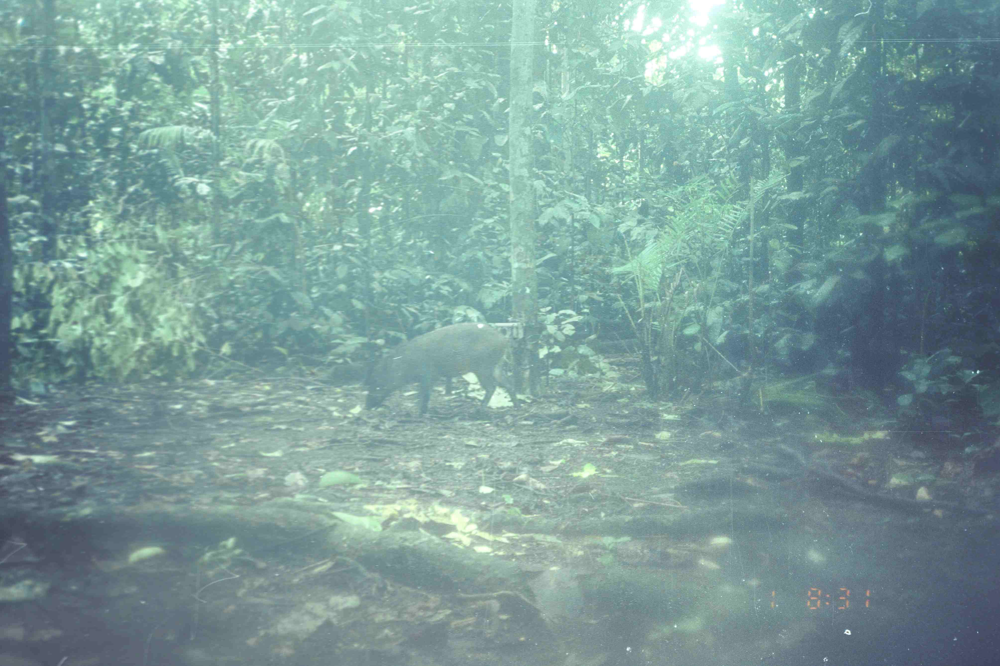

In [26]:
img

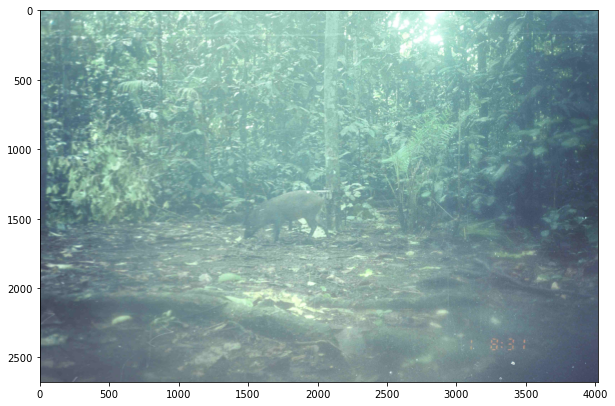

In [28]:
i = 4
url = df.iloc[i]['image']

response = requests.get(url)
img = Image.open(BytesIO(response.content))
imgnp = np.asarray(img)
plt.figure(figsize=(10,7))
plt.imshow(imgnp)

#### plot the bboxes 

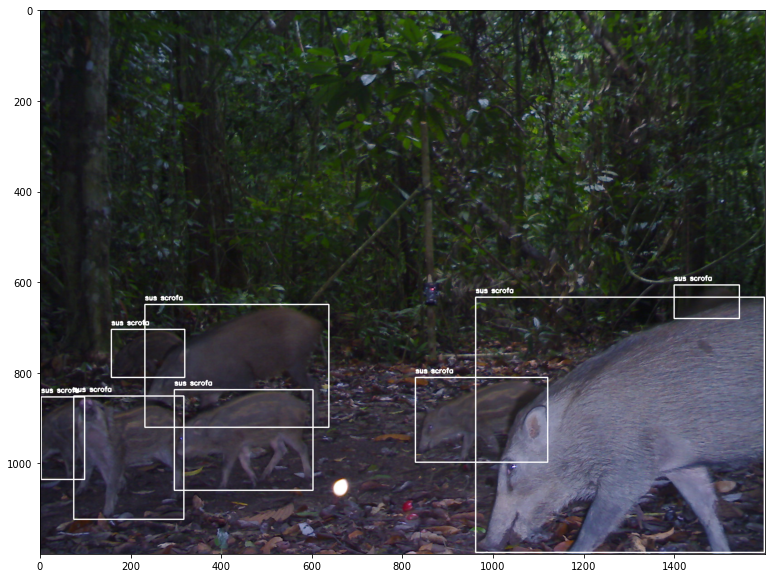

In [29]:
url = 'https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0407/1604.jpg'

response = requests.get(url)
img = Image.open(BytesIO(response.content))
imgnp = np.asarray(img)
dffilt = df[df['image'] == url]
for i in range(dffilt.shape[0]):
    xmin = int(dffilt.iloc[i]['xmin'])
    ymin = int(dffilt.iloc[i]['ymin'])
    xmax = int(dffilt.iloc[i]['xmax'])
    ymax = int(dffilt.iloc[i]['ymax'])
    cattext = dffilt.iloc[i]['category']
    
    cv2.putText(imgnp, cattext, (xmin, ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,255), 2)
    cv2.rectangle(imgnp, (xmin, ymin), (xmax, ymax), (255, 255, 255), 2)

plt.figure(figsize=(15,10))
plt.imshow(imgnp)

In [30]:
dffilt = df[df['image'] == url]
dffilt.sort_values('xmin')

,sample,image,category,xmin,ymin,xmax,ymax
1425,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,2.1392,853.80,98.7152,1035.600
1424,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,74.7840,851.28,317.5040,1123.560
1423,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,157.0720,704.52,319.9520,810.144
1422,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,231.2000,649.68,637.9200,920.280
1426,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,296.9600,837.60,602.8800,1059.600
1427,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,828.6400,810.00,1120.6400,997.560
1428,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,961.1200,633.60,1598.0800,1196.520
1429,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,1399.3600,606.72,1543.1680,680.868


In [31]:
dffilt.shape

(8, 7)

###  put it in a function

In [32]:
def viz_wcs(img_file, df):
    url = img_file
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    imgnp = np.asarray(img)
    dffilt = df[df['image'] == url]
    for i in range(dffilt.shape[0]):
        xmin = int(dffilt.iloc[i]['xmin'])
        ymin = int(dffilt.iloc[i]['ymin'])
        xmax = int(dffilt.iloc[i]['xmax'])
        ymax = int(dffilt.iloc[i]['ymax'])
        cattext = dffilt.iloc[i]['category']

        cv2.putText(imgnp, cattext, (xmin, ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,255), 2)
        cv2.rectangle(imgnp, (xmin, ymin), (xmax, ymax), (255, 255, 255), 2)

    plt.figure(figsize=(15,10))
    plt.imshow(imgnp)

### try a few images 

In [33]:
json_loc = 'wcs_20220205_bboxes_with_classes/wcs_20220205_bboxes_with_classes.json'
filter_categories = [104, 145]
df = wcs_to_csv(json_loc, filter_categories)
df.head()

,sample,image,category,xmin,ymin,xmax,ymax
0,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,511.1808,558.0288,776.6016,921.9072
1,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,412.6720,413.9520,1183.7440,850.6368
3,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,614.6048,785.5104,1806.9504,1527.5520
4,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,884.3264,394.5984,1921.6384,1048.6272
5,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,1456.9268,1296.5220,2084.5384,1653.7680


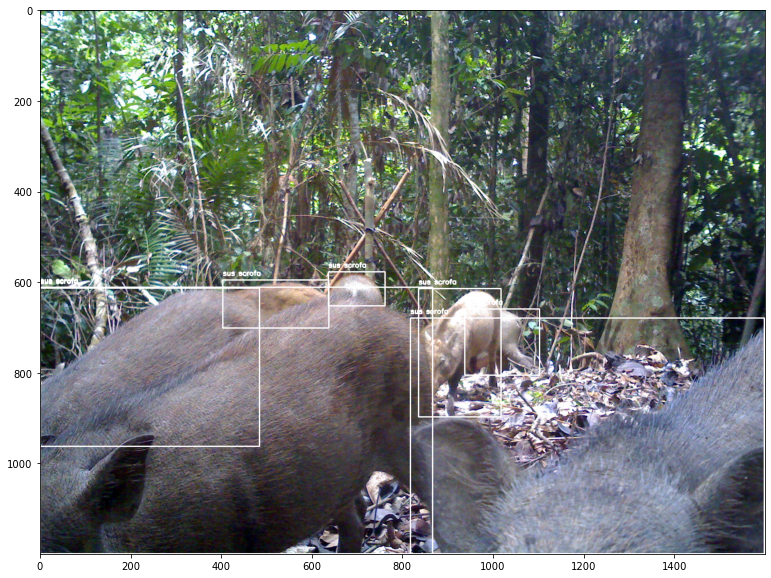

In [34]:
viz_wcs('https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0408/1920.jpg', df)

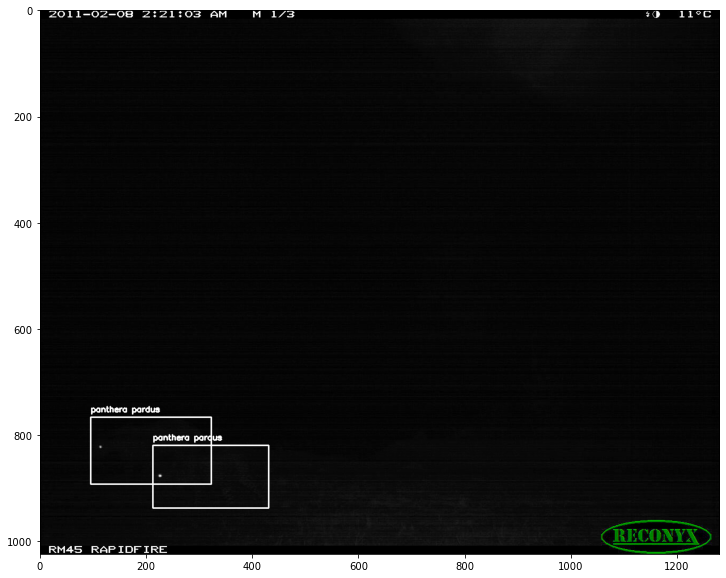

In [35]:
viz_wcs('https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0298/1120.jpg', df)

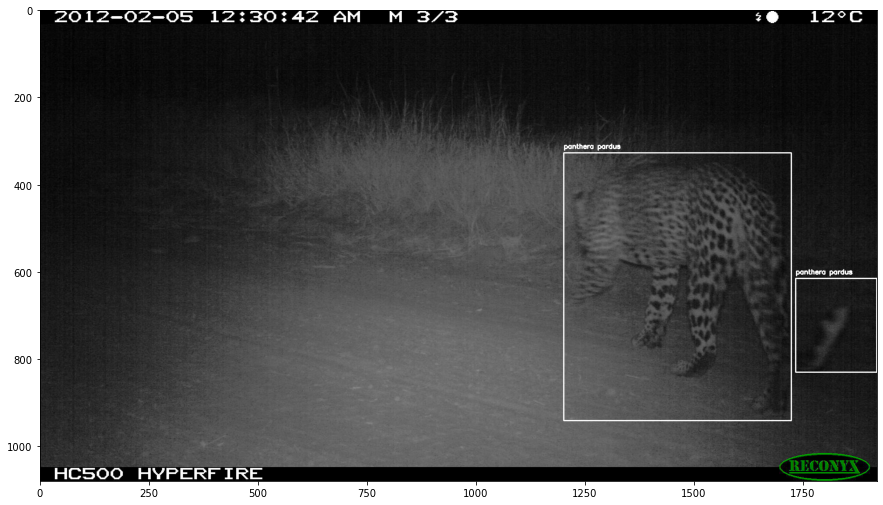

In [36]:
viz_wcs('https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0208/1649.jpg', df)

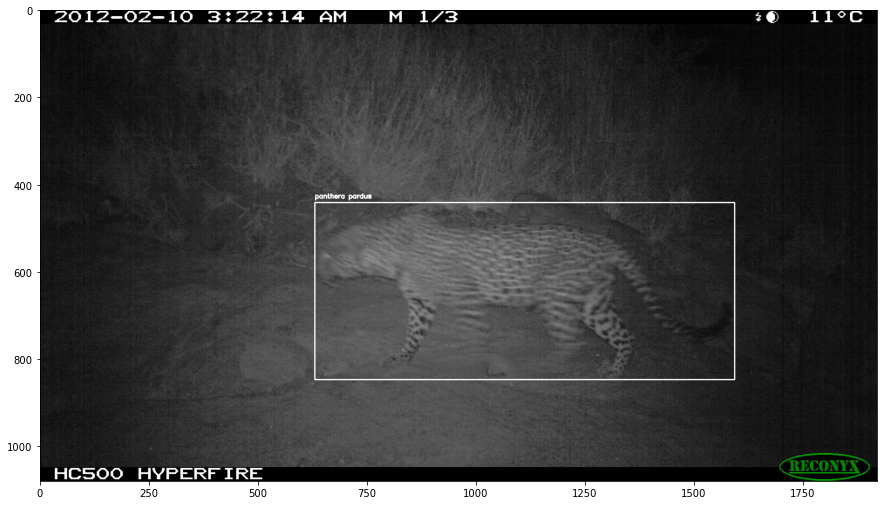

In [37]:
viz_wcs('https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0204/0531.jpg', df)

<a class="anchor" id="2"></a>
## Final functions

In [38]:
def wcs_to_csv(json_loc,
               filter_categories = [104, 145],
                ):
    with open(json_loc, 'r') as f:
        data = json.load(f)
        
    annotdf = pd.DataFrame(data['annotations'])
    annotdf = annotdf[annotdf['bbox'].notna()]
    
    imagedf = pd.DataFrame(data['images'])
    categoriesdf = pd.DataFrame(data['categories'])
    
    filter_categories = filter_categories
    
    annotfiltered = annotdf[annotdf['category_id'].isin(filter_categories)]
    
    finallist = []

    for i in range(annotfiltered.shape[0]):
        img_id = annotfiltered.iloc[i]['image_id']
        for j in range(i,annotfiltered.shape[0]):
            if annotfiltered.iloc[j]['image_id'] == img_id:
                row = {}
                sample = 'TRAINING'

                filename = imagedf[imagedf['id'] == img_id]['file_name'].item()
                abs_filepath = f'https://lilablobssc.blob.core.windows.net/wcs-unzipped/{filename}'

                catid = annotfiltered.iloc[j]['category_id']
                category = categoriesdf[categoriesdf['id'] == catid]['name'].item()

                xmin = annotfiltered.iloc[j]['bbox'][0]
                ymin = annotfiltered.iloc[j]['bbox'][1]
                width = annotfiltered.iloc[j]['bbox'][2]
                height = annotfiltered.iloc[j]['bbox'][3]

                row['sample'] = sample
                row['image'] = abs_filepath
                row['category'] = category
                row['xmin'] = xmin
                row['ymin'] = ymin
                row['xmax'] = xmin + width
                row['ymax'] = ymin + height

                finallist.append(row)

    finaldf = pd.DataFrame(finallist)
    finaldf = finaldf.drop_duplicates()
    
    return finaldf

In [39]:
def viz_wcs(img_file, df):
    url = img_file
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    imgnp = np.asarray(img)
    dffilt = df[df['image'] == url]
    for i in range(dffilt.shape[0]):
        xmin = int(dffilt.iloc[i]['xmin'])
        ymin = int(dffilt.iloc[i]['ymin'])
        xmax = int(dffilt.iloc[i]['xmax'])
        ymax = int(dffilt.iloc[i]['ymax'])
        cattext = dffilt.iloc[i]['category']

        cv2.putText(imgnp, cattext, (xmin, ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,255), 2)
        cv2.rectangle(imgnp, (xmin, ymin), (xmax, ymax), (255, 255, 255), 2)

    plt.figure(figsize=(15,10))
    plt.imshow(imgnp)

In [40]:
json_loc = 'wcs_20220205_bboxes_with_classes/wcs_20220205_bboxes_with_classes.json'
filter_categories = [104, 145]
df = wcs_to_csv(json_loc, filter_categories)
df.head()

,sample,image,category,xmin,ymin,xmax,ymax
0,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,511.1808,558.0288,776.6016,921.9072
1,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,412.6720,413.9520,1183.7440,850.6368
3,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,614.6048,785.5104,1806.9504,1527.5520
4,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,884.3264,394.5984,1921.6384,1048.6272
5,TRAINING,https://lilablobssc.blob.core.windows.net/wcs-...,sus scrofa,1456.9268,1296.5220,2084.5384,1653.7680


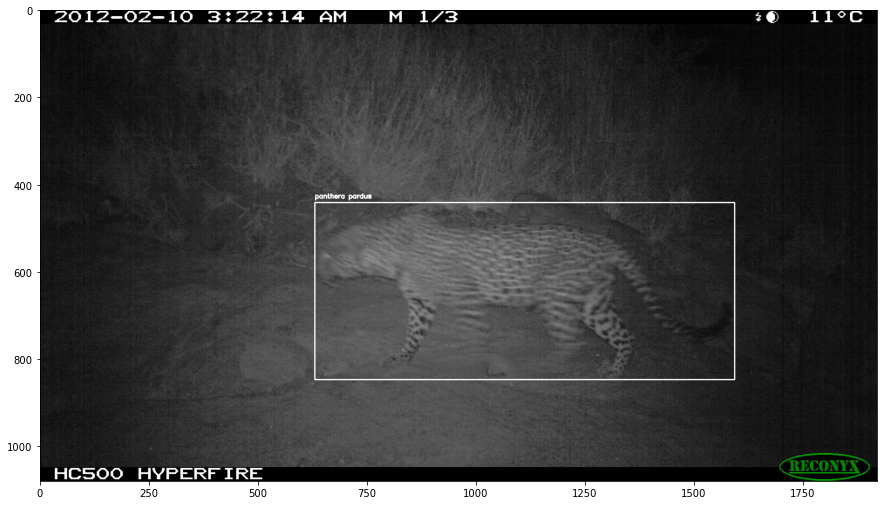

In [41]:
# function takes in an image location. location is on the cloud server
viz_wcs('https://lilablobssc.blob.core.windows.net/wcs-unzipped/animals/0204/0531.jpg', df)

In [44]:
df.to_csv('annotations.csv', index=None)

### Conclusion 

dataset source: https://lila.science/datasets/wcscameratraps
A function was created that converts the annotations from the format given in the source to the format accepted by tflite model maker (the blank columns after xmin, ymin and xmax, ymax havent been inserted) <br>
a function was created, which accepts the image url and displays the image with the bboxes. use df.head() to get some image urls. <br>
**Note:** the images are accessed directly from the cloud, and is not saved locally <br>
the wcs_to_csv function takes a few minutes to run

### appendix 